# Conversion of leads with decision trees

In [211]:
# import libraries

In [212]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, roc_curve, auc
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LogisticRegression
import warnings
warnings.filterwarnings('ignore')

In [213]:
# Import data

In [214]:
df = pd.read_csv('EON.csv')

In [215]:
df.head()

,Prospect ID,Lead Number,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,...,Get updates on DM Content,Lead Profile,City,Asymmetrique Activity Index,Asymmetrique Profile Index,Asymmetrique Activity Score,Asymmetrique Profile Score,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Last Notable Activity
0,7927b2df-8bba-4d29-b9a2-b6e0beafe620,660737,API,Olark Chat,No,No,0,0.0,0,0.0,...,No,Select,Select,02.Medium,02.Medium,15.0,15.0,No,No,Modified
1,2a272436-5132-4136-86fa-dcc88c88f482,660728,API,Organic Search,No,No,0,5.0,674,2.5,...,No,Select,Select,02.Medium,02.Medium,15.0,15.0,No,No,Email Opened
2,8cc8c611-a219-4f35-ad23-fdfd2656bd8a,660727,Landing Page Submission,Direct Traffic,No,No,1,2.0,1532,2.0,...,No,Potential Lead,Mumbai,02.Medium,01.High,14.0,20.0,No,Yes,Email Opened
3,0cc2df48-7cf4-4e39-9de9-19797f9b38cc,660719,Landing Page Submission,Direct Traffic,No,No,0,1.0,305,1.0,...,No,Select,Mumbai,02.Medium,01.High,13.0,17.0,No,No,Modified
4,3256f628-e534-4826-9d63-4a8b88782852,660681,Landing Page Submission,Google,No,No,1,2.0,1428,1.0,...,No,Select,Mumbai,02.Medium,01.High,15.0,18.0,No,No,Modified


In [216]:
# We have two variables that could function as 'ID': Prospect ID and Lead Number.
# Let's drop the more complex one, Prospect ID.

In [217]:
df.drop(columns= 'Prospect ID', axis = 1, inplace = True)

In [218]:
df.set_index('Lead Number', inplace = True)

In [219]:
df.head()

,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Country,...,Get updates on DM Content,Lead Profile,City,Asymmetrique Activity Index,Asymmetrique Profile Index,Asymmetrique Activity Score,Asymmetrique Profile Score,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Last Notable Activity
Lead Number,,,,,,,,,,,,,,,,,,,,,
660737,API,Olark Chat,No,No,0,0.0,0,0.0,Page Visited on Website,NaN,...,No,Select,Select,02.Medium,02.Medium,15.0,15.0,No,No,Modified
660728,API,Organic Search,No,No,0,5.0,674,2.5,Email Opened,India,...,No,Select,Select,02.Medium,02.Medium,15.0,15.0,No,No,Email Opened
660727,Landing Page Submission,Direct Traffic,No,No,1,2.0,1532,2.0,Email Opened,India,...,No,Potential Lead,Mumbai,02.Medium,01.High,14.0,20.0,No,Yes,Email Opened
660719,Landing Page Submission,Direct Traffic,No,No,0,1.0,305,1.0,Unreachable,India,...,No,Select,Mumbai,02.Medium,01.High,13.0,17.0,No,No,Modified
660681,Landing Page Submission,Google,No,No,1,2.0,1428,1.0,Converted to Lead,India,...,No,Select,Mumbai,02.Medium,01.High,15.0,18.0,No,No,Modified


In [220]:
# Let's examine the data to check its type and see if there are any missing values
# We notice that there are 9240 records, but out of the 35 variables, 17 have null values

In [221]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 9240 entries, 660737 to 579533
Data columns (total 35 columns):
 #   Column                                         Non-Null Count  Dtype  
---  ------                                         --------------  -----  
 0   Lead Origin                                    9240 non-null   object 
 1   Lead Source                                    9204 non-null   object 
 2   Do Not Email                                   9240 non-null   object 
 3   Do Not Call                                    9240 non-null   object 
 4   Converted                                      9240 non-null   int64  
 5   TotalVisits                                    9103 non-null   float64
 6   Total Time Spent on Website                    9240 non-null   int64  
 7   Page Views Per Visit                           9103 non-null   float64
 8   Last Activity                                  9137 non-null   object 
 9   Country                                        677

In [222]:
# As part of our data preparation, we will review the variables one by one to correct their data types
# and make the respective imputations for missing data

In [223]:
# Lead Source
# Let's make a bar chart to count the sources of traffic

<Axes: xlabel='count', ylabel='Lead Source'>

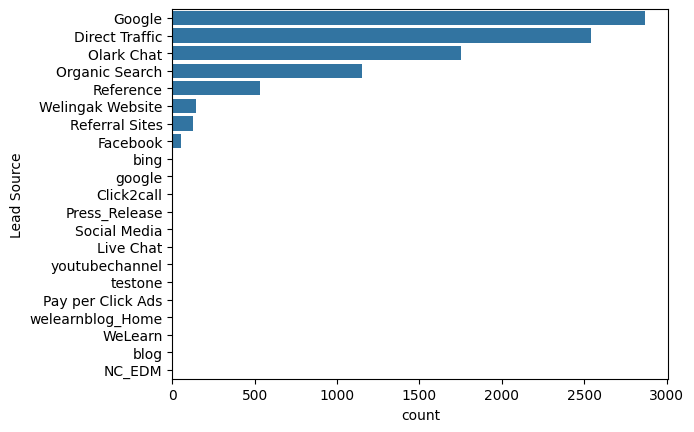

In [224]:
sns.countplot(y='Lead Source', data = df, order = df['Lead Source'].value_counts().index)

If in the exploratory data analysis we had identified a traffic source (Lead Source) that was clearly the most common, the most straightforward strategy would have been to replace the missing values with the most frequent traffic source, i.e., the mode. This is based on the assumption that a new lead is more likely to come from the most common source. Since this is not the case, we will simply assign the value "Desconocido" to the missing values.

In [225]:
df['Lead Source'] =df['Lead Source'].fillna('Desconocido')

Data Type Correction: Do Not Email, Do Not Call, Converted

Do Not Email: A binary indicator variable selected by the client where they choose whether or not they want to receive emails about the course.

Do Not Call: A binary indicator variable selected by the client where they choose whether or not they want to receive calls about the course.

Converted: The target variable. Indicates whether a lead has been successfully converted or not.









In [226]:
# Convert the variables to boolean. Since we will do the same with all three, let's use a for loop

In [227]:
for v in ['Do Not Email', 'Do Not Call', 'Converted']:
    df[v] = df[v].replace('Yes', 1)
    df[v] = df[v].replace('No', 0)
    df[v] = df[v].astype(bool)

Handling Missing Values: TotalVisits and Page Views Per Visit

TotalVisits: The total number of visits made by the client on the website.

Page Views Per Visit: The total number of pages viewed by the client during their visits on the website.

We evaluate the distribution of each of these features to determine the best method for imputation.

In [228]:
# Let's examine the distribution of Total Visits

In [229]:
df['TotalVisits'].describe()

count    9103.000000
mean        3.445238
std         4.854853
min         0.000000
25%         1.000000
50%         3.000000
75%         5.000000
max       251.000000
Name: TotalVisits, dtype: float64

In [230]:
# Let's create a histogram of the distribution

<Axes: xlabel='TotalVisits', ylabel='Count'>

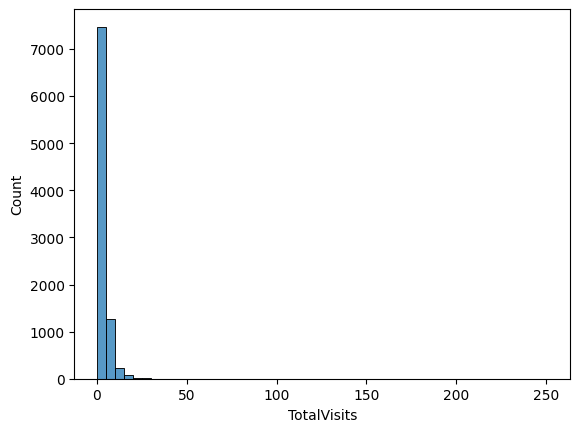

In [231]:
sns.histplot(x='TotalVisits', data=df, bins=50)

In [232]:
# Let's examine the distribution of 'Page Views Per Visit'

In [233]:
df['Page Views Per Visit'].describe()

count    9103.000000
mean        2.362820
std         2.161418
min         0.000000
25%         1.000000
50%         2.000000
75%         3.000000
max        55.000000
Name: Page Views Per Visit, dtype: float64

In [234]:
# Let's examine the distribution of 'Page Views Per Visit'

<Axes: xlabel='Page Views Per Visit', ylabel='Count'>

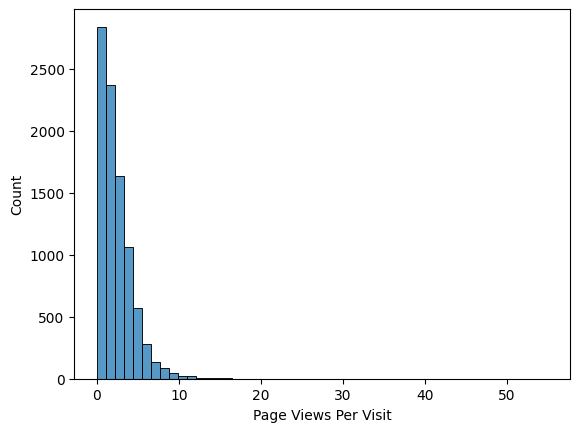

In [235]:
sns.histplot(x='Page Views Per Visit', data=df, bins=50)

When a distribution is severely skewed, using the median for imputing missing values is appropriate because the median is less susceptible to the influence of outliers or extreme values, providing a better central estimate for skewed data.

If the distribution of these features were not skewed and instead followed a normal (symmetric) distribution, we could consider using the mean for imputing missing values. The mean is a good and representative measure of central tendency for distributions that are not skewed, as in a normal distribution, the mean and median are virtually the same.

In [236]:
# Impute the median for the missing values in TotalVisits

In [237]:
df['TotalVisits'] = df['TotalVisits'].fillna(df['TotalVisits'].median())

In [238]:
# Impute the median for the missing values in 'Page Views Per Visit'

In [239]:
df['Page Views Per Visit'] = df['Page Views Per Visit'].fillna(df['Page Views Per Visit'].median())

In [240]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 9240 entries, 660737 to 579533
Data columns (total 35 columns):
 #   Column                                         Non-Null Count  Dtype  
---  ------                                         --------------  -----  
 0   Lead Origin                                    9240 non-null   object 
 1   Lead Source                                    9240 non-null   object 
 2   Do Not Email                                   9240 non-null   bool   
 3   Do Not Call                                    9240 non-null   bool   
 4   Converted                                      9240 non-null   bool   
 5   TotalVisits                                    9240 non-null   float64
 6   Total Time Spent on Website                    9240 non-null   int64  
 7   Page Views Per Visit                           9240 non-null   float64
 8   Last Activity                                  9137 non-null   object 
 9   Country                                        677

# Preprocessing II

Handling Missing Values: Last Activity

Last Activity: The last activity performed by the client. Includes email opens, conversations in Olark Chat, etc.

Evaluate the distribution of this feature to determine the best method for imputing missing values.

In [241]:
# Distribution Plot of Last Activity

<Axes: xlabel='count', ylabel='Last Activity'>

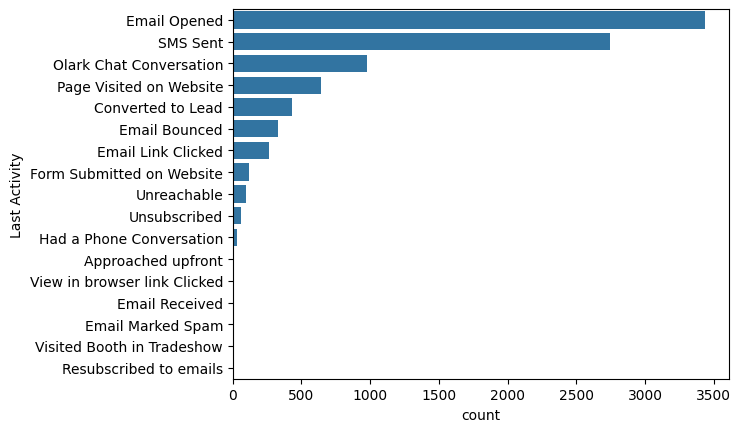

In [242]:
sns.countplot(y='Last Activity', data = df, order = df['Last Activity'].value_counts().index)


Data preprocessing is a crucial phase in any data science project, as it not only cleans the data but also provides an opportunity to deeply understand the characteristics and nature of the data we are working with. Through visualization, such as the chart above, we can gain a richer and more detailed understanding of the data that goes beyond a simple textual description.

For example, a distribution chart of 'Last Activity' reveals patterns of behavior, preferences, and possibly the effectiveness of different communication channels. Observing that no single activity clearly dominates over the others (with a threshold above 80-95%) suggests that there is no unique trend in how customers interact with the company.

In such a scenario, it is reasonable to assign the value "Desconocido" to missing records in 'Last Activity'. This allows us to maintain data integrity without introducing a bias toward a particular activity that is not representative of the majority. By doing this, we acknowledge and record the absence of information, rather than incorrectly assuming a predominant activity.

It is important to emphasize that this approach is not only practical from the perspective of handling missing data but also valuable from an analytical perspective, as it allows us to identify and recognize the limitations of our data and possibly raise questions for future research or more effective data collection strategies.

In [243]:
df['Last Activity'] = df['Last Activity'].fillna('Desconocido')

In [244]:
# Let's analyze Country: the lead's country

In [245]:
# Distribution Plot of Leads by Country

<Axes: xlabel='count', ylabel='Country'>

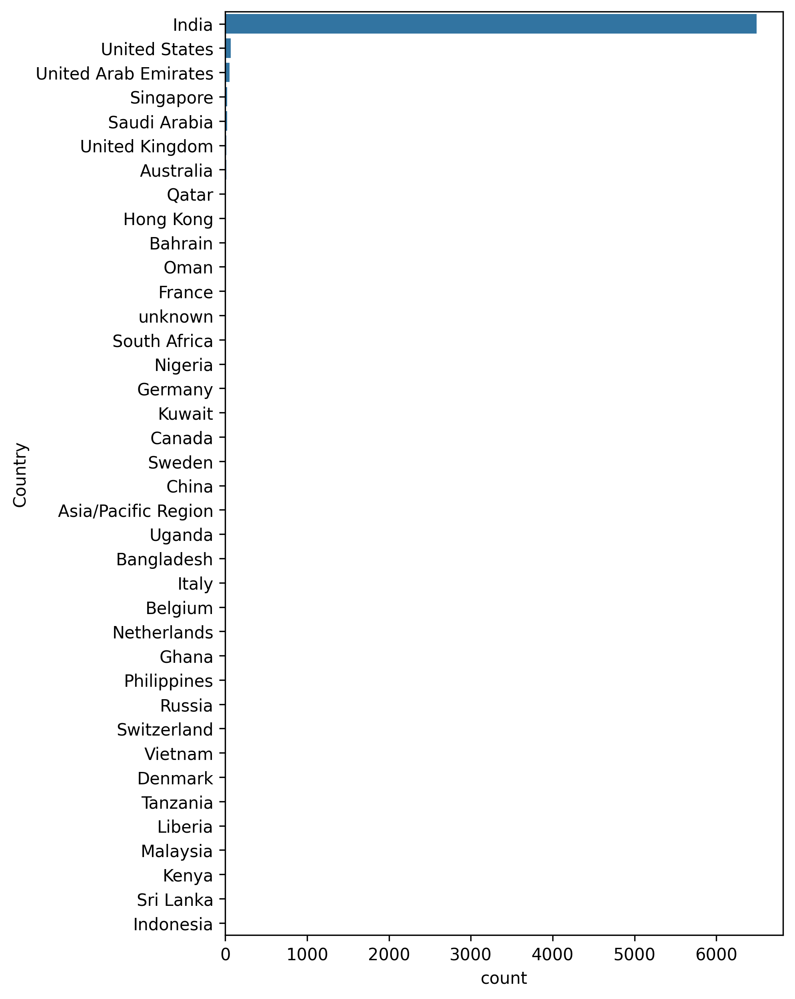

In [246]:
plt.figure(figsize = (6, 10), dpi = 300)
sns.countplot(y='Country', data = df, order = df['Country'].value_counts().index)

In [ ]:
6779/9240

0.7336580086580087

In [ ]:
# The number of missing data is more than a quarter. And more than two-thirds are from India...
# In this particular case, we wouldn’t want to simply place 'Unknown' when we know it is very likely
# that they are from India and when we have another variable (City) 
# that can help us deduce the country of the missing values

In [ ]:
# Let's plot the distribution of 'City' when 'Country' is missing

<Axes: xlabel='count', ylabel='City'>

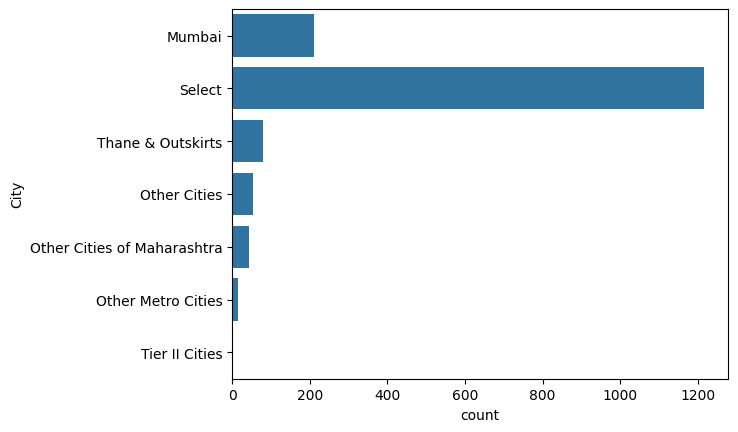

In [ ]:
sns.countplot(y='City', data = df[df['Country'].isna()], order = df['City'].value_counts().index)

In [ ]:
# Analyzing this variable provides us with very relevant insights for handling missing values in 'Country'
# We can assign 'India' to the missing values where the City is Mumbai, Other Cities of Maharashtra, or Thane & Outskirts
# We create a for loop with a nested if statement. For records in the list of the three cities in India,
# we assign India; for the rest of the missing values, we assign "Desconocido"

In [ ]:
ciudades_india = ['Mumbai','Other Cities of Maharashtra','Thane & Outskirts']

In [ ]:
for i in df[df['Country'].isnull()].index:
    if df.loc[i, 'City'] in ciudades_india:
        df.loc[i, 'Country'] = 'India'
    else:
        df.loc[i, 'Country'] = 'Desconocido'

Explanation:
df['Country'].isnull(): This part of the code creates a boolean Series that is True when the value in the 'Country' column is NaN (a missing value).
df[df['Country'].isnull()]: Here, the boolean Series is used to filter the DataFrame df, selecting only the rows where 'Country' is NaN.
.index: This attribute returns the indices of all rows that meet the previous condition (i.e., rows with missing values in 'Country').
The for i in ... loop iterates over these indices, assigning each index i to a row with a missing value in 'Country'.

df.loc[i, 'City']: loc is an accessor used to access a group of rows and columns by labels or a boolean array. Here, df.loc[i, 'City'] refers to the value in the row with index i and in the column 'City'.

ciudades_india: This is an iterable object containing names of cities in India.

if ... in ciudades_india: This checks if the value in the 'City' column for row i is present in the ciudades_india set.

df.loc[i, 'Country'] = 'India' and df.loc[i, 'Country'] = 'Desconocido':

If the if condition is True (meaning the city in row i is one of the ciudades_india), then the value of 'Country' for that row is set to 'India'.
If the if condition is False (the city in row i is not in ciudades_india or the city is also NaN), then the value of 'Country' for that row is set to 'Desconocido'.

**Data Type Correction: Search, Magazine, Newspaper Article, X Education Forums, Newspaper, Digital Advertisement**

- **Search:** Indicates whether the customer has seen the advertisement in any of the listed items (e.g., during a web search).

- **Magazine:** Indicates whether the customer has seen the advertisement in any of the listed items (e.g., in a magazine).

- **Newspaper Article:** Indicates whether the customer has seen the advertisement in any of the listed items (e.g., in a newspaper article).

- **X Education Forums:** Indicates whether the customer has seen the advertisement in any of the listed items (e.g., in an X Education forum).

- **Newspaper:** Indicates whether the customer has seen the advertisement in any of the listed items (e.g., in a newspaper).

- **Digital Advertisement:** Indicates whether the customer has seen the advertisement in any of the listed items (e.g., in a digital ad).

- **Through Recommendations:** Indicates whether the customer arrived through recommendations.

- **Receive More Updates About Our Courses:** Indicates whether the customer chose to receive more updates about the courses.

These features will be easier to handle, interpret, and use in a model by converting them into boolean values.

In [ ]:
# The variables are similar and have no missing values
# We will handle them similarly. Let's convert them to boolean values using a for loop

In [ ]:
for c in ['Search', 'Magazine', 'Newspaper Article', 'X Education Forums', 'Newspaper', 
          'Digital Advertisement', 'Through Recommendations', 'Receive More Updates About Our Courses']:
    df[c] = df[c].replace('Yes', 1)
    df[c] = df[c].replace('No', 0)
    df[c] = df[c].astype(bool)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 9240 entries, 660737 to 579533
Data columns (total 35 columns):
 #   Column                                         Non-Null Count  Dtype  
---  ------                                         --------------  -----  
 0   Lead Origin                                    9240 non-null   object 
 1   Lead Source                                    9240 non-null   object 
 2   Do Not Email                                   9240 non-null   bool   
 3   Do Not Call                                    9240 non-null   bool   
 4   Converted                                      9240 non-null   bool   
 5   TotalVisits                                    9240 non-null   float64
 6   Total Time Spent on Website                    9240 non-null   int64  
 7   Page Views Per Visit                           9240 non-null   float64
 8   Last Activity                                  9240 non-null   object 
 9   Country                                        924

# Preprocessing III

**Handling Missing Values: Specialization, How did you hear about X Education, What is your current occupation, What matters most to you in choosing a course**

- **Specialization:** The industry domain in which the client previously worked. Includes the level 'Select Specialization,' indicating that the client did not select any option while filling out the form.

- **How did you hear about X Education:** The source from which the client learned about X Education.

- **What is your current occupation:** Indicates whether the client is a student, unemployed, or employed.

- **What matters most to you in choosing a course:** An option selected by the client indicating their main reason for taking this course.

Evaluate the distribution of these features to determine the best method for imputing missing values. This could be done one by one, or we could use a for loop to automate the process.

In [ ]:
# Let's examine the distribution of the form variables
# We'll make a list of the 4 variables, and then use a for loop to plot them as subplots.

In [ ]:
variables = ['Specialization', 'How did you hear about X Education',
             'What is your current occupation','What matters most to you in choosing a course']

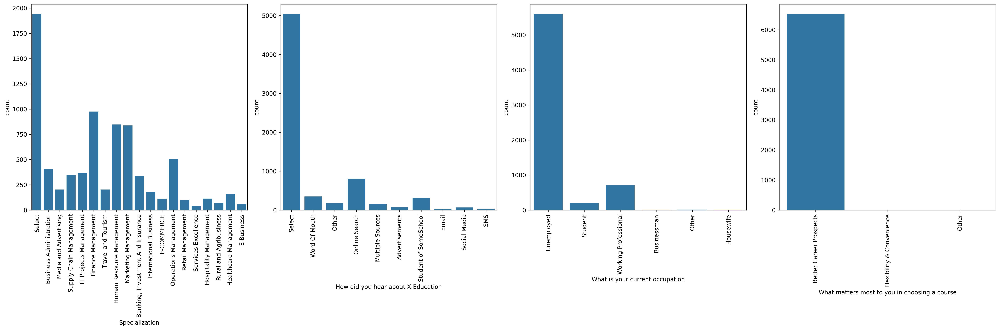

In [ ]:
fig, ejes = plt.subplots(nrows=1, ncols=4, figsize=(24,8), dpi =300)
for i in range(4):
    sns.countplot(x=variables[i], data = df, ax=ejes[i])
    plt.sca(ejes[i])
    plt.xticks(rotation=90)
plt.tight_layout()

The charts show the distribution of values for one or more categorical variables in a dataset, where a large number of observations have the label "Select." In the context of data analysis, the "Select" label is often used in data entry forms to indicate that the user did not select any of the available options. In subsequent analysis, these values are effectively equivalent to null or missing values, as they do not provide useful information about the actual category.

It is important to note that in the 'What matters most to you in choosing a course' chart, which is on the right, we encounter a case that allows for possible imputation of missing values with the option 'Better Career Prospects'. This category clearly dominates over 'Flexibility & Convenience' and 'Others', indicating that most respondents prioritize career prospects when choosing a course. If deemed appropriate, imputing the mode to the missing values could be considered, assuming that missing data is very likely to correspond to the better career prospects option due to the overwhelming number of observations supporting it.

However, for consistency and to preserve data integrity, we will opt to assign the value 'Desconocido' to the missing data. It should be noted that, among all the variables in our preprocessing process, 'What matters most to you in choosing a course' would be the most clear-cut example to justify imputing missing values using the mode.

In [ ]:
# Replacing 'Select' and missing values with 'Desconociddo'

In [ ]:
for c in variables:
    df[c].replace('Select', 'Desconocido', inplace = True)
    df[c].fillna('Desconocido', inplace = True)

**Data Type Correction: Update me on Supply Chain Content, Get updates on DM Content**

- **Update me on Supply Chain Content:** Indicates whether the customer wants to receive updates about supply chain content.

- **Get updates on DM Content:** Indicates whether the customer wants to receive updates about DM content.

These features will be easier to handle, interpret, and use in a model by converting them into boolean values.

In [ ]:
for c in ['Update me on Supply Chain Content', 'Get updates on DM Content']:
    df[c] = df[c].replace('Yes', 1)
    df[c] = df[c].replace('No', 0)
    df[c] = df[c].astype(bool)

**Remove Variable: Tags**

- **Tags:** Labels assigned to customers that indicate the current status of the potential customer.

Since Tags is determined by the progress of a potential customer through the marketing funnel, it is likely to be endogenous to the lead conversion status. As a result, this feature should be removed.

**A bit of theory:** The term "endogenous" refers to factors or variables that originate within a given system, as opposed to those coming from outside or being "exogenous." In the context of a statistical or economic model, an endogenous variable is one whose value is influenced by other variables within the model.

For example, in a model that aims to predict the conversion of potential leads into actual customers, an endogenous variable would be one that is directly related to the conversion process internally, such as customer interaction with the sales funnel, and can be affected by other factors within the same system, such as applied marketing strategies. In other words, if the variable 'Tags' is assigned as the customer progresses through the marketing funnel and is directly related to the likelihood of conversion, then it is endogenous to the lead conversion model because it is both a consequence and a part of the conversion process. Since it is related directly to what we want to predict (Converted), it should not be used as an independent variable in the model.

In [ ]:
# Remove the 'Tags' variable from the DataFrame

In [ ]:
df.drop(columns='Tags', axis = 1, inplace = True)

Remove Variable: Lead Quality

Lead Quality: Indicates the quality of the potential lead based on the data and the intuition of the assigned employee.

Since Lead Quality is the measure we are looking to replace with Lead Score, it should not be included in our model.

In [ ]:
# Remove the 'Lead Quality' variable

In [ ]:
df.drop(columns='Lead Quality', axis = 1, inplace = True)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 9240 entries, 660737 to 579533
Data columns (total 33 columns):
 #   Column                                         Non-Null Count  Dtype  
---  ------                                         --------------  -----  
 0   Lead Origin                                    9240 non-null   object 
 1   Lead Source                                    9240 non-null   object 
 2   Do Not Email                                   9240 non-null   bool   
 3   Do Not Call                                    9240 non-null   bool   
 4   Converted                                      9240 non-null   bool   
 5   TotalVisits                                    9240 non-null   float64
 6   Total Time Spent on Website                    9240 non-null   int64  
 7   Page Views Per Visit                           9240 non-null   float64
 8   Last Activity                                  9240 non-null   object 
 9   Country                                        924

# Preprocessing IV

**Handling Missing Values: Lead Profile**

- **Lead Profile:** A lead level assigned to each customer based on their profile.

Evaluate the distribution of this feature to determine the best method for imputing missing values.

In [ ]:
# Lead Profile Distribution Chart

<Axes: xlabel='count', ylabel='Lead Profile'>

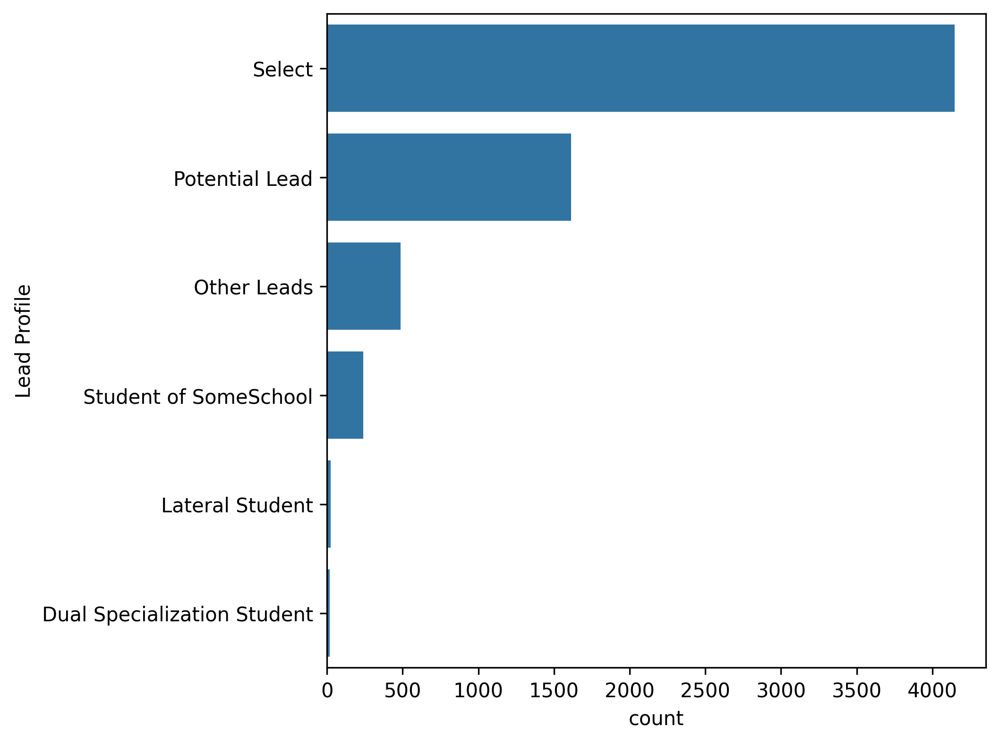

In [ ]:
plt.figure(figsize = (6, 6), dpi = 300)
sns.countplot(y='Lead Profile', data = df, order = df['Lead Profile'].value_counts().index)

A large portion of the values are "Select," which is equivalent to a null.

In [ ]:
# Replace 'Select' with 'Desconocido'
# Fill missing values with 'Desconocido'

In [ ]:
df['Lead Profile'].replace('Select', 'Desconocido', inplace = True)

In [ ]:
df['Lead Profile'].fillna('Desconocido', inplace=True)

**Handling Missing Values: City**

- **City:** The city of the potential customer.

Evaluate the distribution of this feature to determine the best method for imputing missing values.

<Axes: xlabel='count', ylabel='City'>

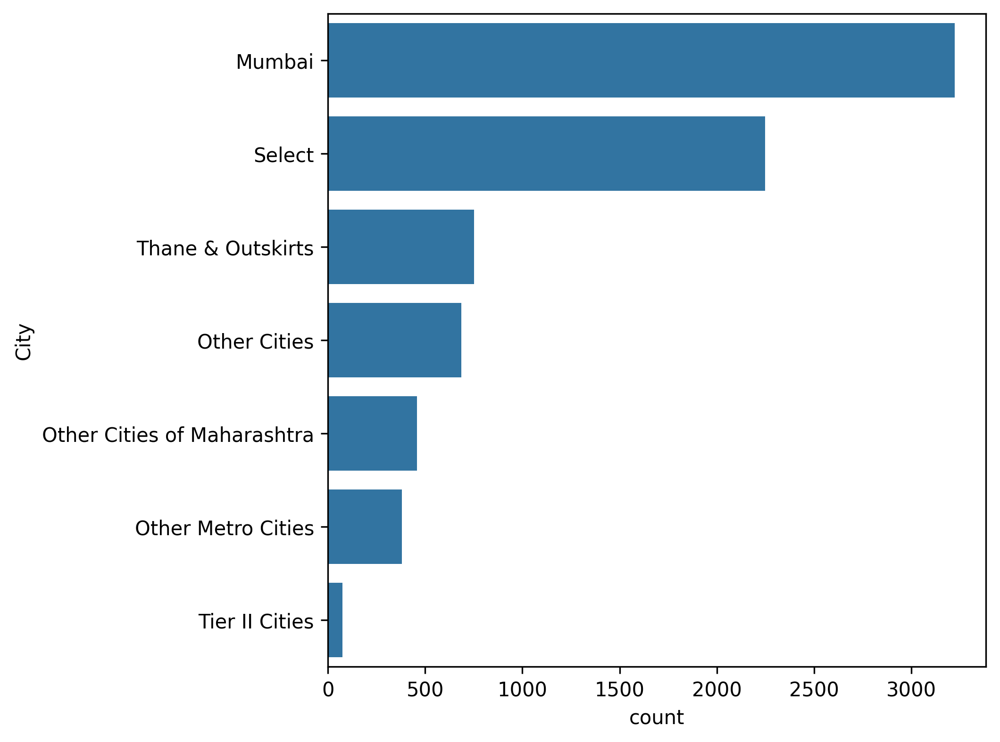

In [ ]:
plt.figure(figsize = (6, 6), dpi = 300)
sns.countplot(y='City', data = df, order = df['City'].value_counts().index)

A large portion of the values are "Select," which is equivalent to a null.

In [ ]:
# Replace 'Select' with 'Desconocido'
# Fill missing values with 'Desconocido'

In [ ]:
df['City'].replace('Select', 'Desconocido', inplace = True)

In [ ]:
df['City'].fillna('Desconocido', inplace=True)

**Data Type Correction: I agree to pay the amount through cheque, A free copy of Mastering The Interview**

- **I agree to pay the amount through cheque:** Indicates whether the customer has agreed to pay the amount by cheque or not.

- **A free copy of Mastering The Interview:** Indicates whether the customer wants a free copy of 'Mastering the Interview' or not.

These features will be easier to handle, interpret, and use in a model by converting them into boolean values.

In [ ]:
# Convert Yes/No variables to boolean values

In [ ]:
for c in ['I agree to pay the amount through cheque', 'A free copy of Mastering The Interview']:
    df[c] = df[c].replace('Yes', 1)
    df[c] = df[c].replace('No', 0)
    df[c] = df[c].astype(bool)

Data Type Correction: Object to Category

In [ ]:
# Convert string (object) data to categorical data type

In [ ]:
for c in df.columns:
    if df[c].dtype == 'object':
        df[c] = df[c].astype('category')

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 9240 entries, 660737 to 579533
Data columns (total 33 columns):
 #   Column                                         Non-Null Count  Dtype   
---  ------                                         --------------  -----   
 0   Lead Origin                                    9240 non-null   category
 1   Lead Source                                    9240 non-null   category
 2   Do Not Email                                   9240 non-null   bool    
 3   Do Not Call                                    9240 non-null   bool    
 4   Converted                                      9240 non-null   bool    
 5   TotalVisits                                    9240 non-null   float64 
 6   Total Time Spent on Website                    9240 non-null   int64   
 7   Page Views Per Visit                           9240 non-null   float64 
 8   Last Activity                                  9240 non-null   category
 9   Country                                

**Indices and Asymmetric Scores**

- **Asymmetrique Activity Index:** An index assigned to each customer based on their activity: high, medium, and low.

- **Asymmetrique Profile Index:** An index assigned to each customer based on their profile: high, medium, and low.

- **Asymmetrique Activity Score:** A score assigned to each customer based on their activity.

- **Asymmetrique Profile Score:** A score assigned to each customer based on their profile.

Evaluate the distribution of each feature to determine the most appropriate method for imputing missing values.

In [ ]:
# Descriptive statistics of the scores

In [ ]:
estadisticas_scores = pd.DataFrame(
    {'Assymmetrique Activity Score': df['Asymmetrique Activity Score'].describe(),
    'Asymmetrique Profile Score': df['Asymmetrique Profile Score'].describe()})

In [ ]:
estadisticas_scores

,Assymmetrique Activity Score,Asymmetrique Profile Score
count,5022.000000,5022.000000
mean,14.306252,16.344883
std,1.386694,1.811395
min,7.000000,11.000000
25%,14.000000,15.000000
50%,14.000000,16.000000
75%,15.000000,18.000000
max,18.000000,20.000000


In [ ]:
# Noting that the median is slightly to the left (i.e., lower) than the mean in both cases. To confirm,
# let's create a histogram

In [ ]:
# Plot the distribution of the scores

In [ ]:
scores = ['Asymmetrique Activity Score','Asymmetrique Profile Score']

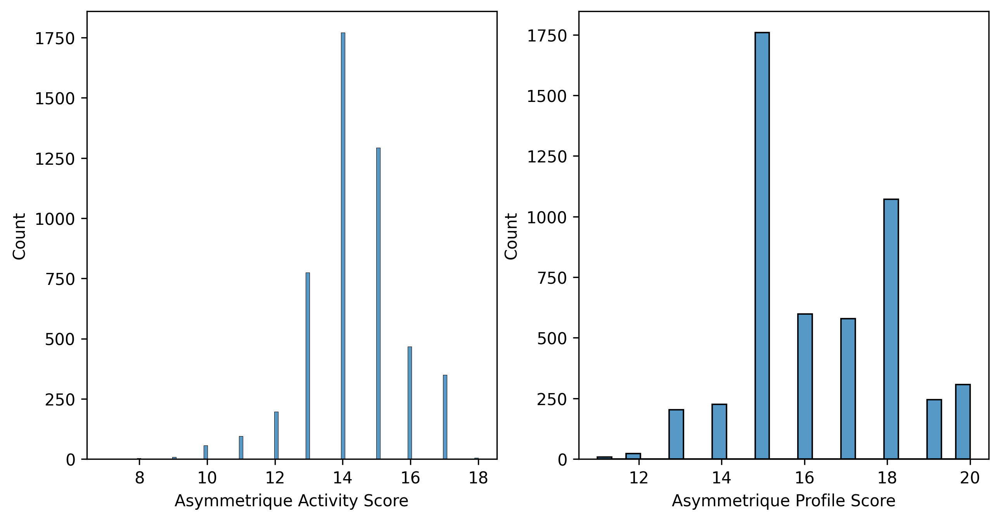

In [ ]:
fig, ejes = plt.subplots(nrows=1, ncols=2, figsize=(10,5), dpi = 300)
for i in range(2):
    sns.histplot(x=scores[i], data = df, ax=ejes[i])

In [ ]:
# Both are skewed, so it would be more appropriate to fill missing values with the median rather than the mean

In [ ]:
for s in scores:
    df[s].fillna(df[s].median(), inplace = True)

In [ ]:
# Now let's create a histogram for the indices

In [ ]:
indices = ['Asymmetrique Activity Index','Asymmetrique Profile Index']

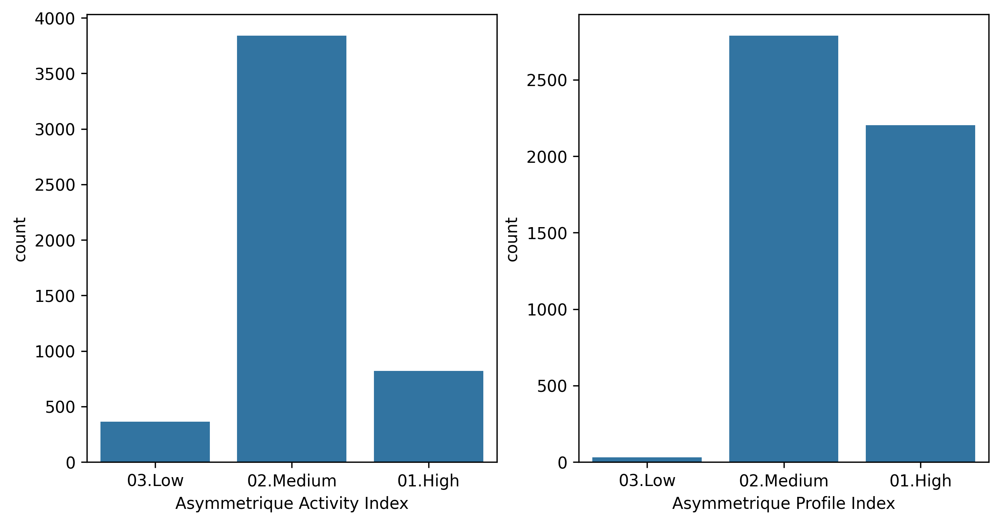

In [ ]:
fig, ejes = plt.subplots(nrows=1, ncols=2, figsize=(10,5), dpi = 300)
for i in range(2):
    sns.countplot(x=indices[i], data = df, ax=ejes[i], order = ['03.Low','02.Medium','01.High'])

It seems that the index features may simply be grouped according to the Asymmetric Score, in which case both index features are redundant. We can confirm this by examining the average Asymmetric Score by Asymmetric Index.

In [ ]:
# Group by the Asymmetric Activity Index
# The `agg` method in Pandas is used to apply one or more aggregation functions to a data series.
# In the context of the code we will write, `agg` is used after `groupby` to calculate the mean ('mean')
# of the 'Asymmetrique Activity Score' column for each unique group in 'Asymmetrique Activity Index'.

In [ ]:
agrupados_por_activity_index = df.groupby('Asymmetrique Activity Index').agg({'Asymmetrique Activity Score':'mean'})

In [ ]:
agrupados_por_activity_index

,Asymmetrique Activity Score
Asymmetrique Activity Index,
01.High,16.437272
02.Medium,14.134931
03.Low,11.290055


In [ ]:
# Let's group by the Asymmetric Profile Index

In [ ]:
agrupados_por_profile_index = df.groupby('Asymmetrique Profile Index').agg({'Asymmetrique Profile Score':'mean'})

In [ ]:
agrupados_por_profile_index

,Asymmetrique Profile Score
Asymmetrique Profile Index,
01.High,18.128007
02.Medium,14.987446
03.Low,11.709677


As can be seen from the calculations above, the Asymmetrique Activity/Profile Index values ​​appear to simply group the Asymmetrique Activity/Profile Scores together. As a result, index features are redundant and can be removed.

In [ ]:
# Let's drop the index columns

In [ ]:
df.drop(columns=['Asymmetrique Profile Index','Asymmetrique Activity Index'], axis=1, inplace=True)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 9240 entries, 660737 to 579533
Data columns (total 31 columns):
 #   Column                                         Non-Null Count  Dtype   
---  ------                                         --------------  -----   
 0   Lead Origin                                    9240 non-null   category
 1   Lead Source                                    9240 non-null   category
 2   Do Not Email                                   9240 non-null   bool    
 3   Do Not Call                                    9240 non-null   bool    
 4   Converted                                      9240 non-null   bool    
 5   TotalVisits                                    9240 non-null   float64 
 6   Total Time Spent on Website                    9240 non-null   int64   
 7   Page Views Per Visit                           9240 non-null   float64 
 8   Last Activity                                  9240 non-null   category
 9   Country                                

# Exploratory Analysis of Categorical Variables

In [ ]:
# We create the function count_of_converts: It will make a bar graph (countplot) comparing the converted and non-converted
# for the respective independent variable. It will be very useful for categorical variables.

In [ ]:
def conteo_de_convertidos(independiente, dependiente = 'Converted'):
    plt.figure(figsize=(6,6), dpi = 300)
    sns.countplot(y=independiente, data = df, hue= dependiente, order = df[independiente].value_counts().index)
    plt.title("Distribución de la variable categórica " + independiente + " por Convertidos")
    plt.show

In [ ]:
# Now let's calculate the lead conversion ratio across the entire data set
# Since it is boolean (they are ones), we only have to take the average

In [ ]:
tasa_de_conversion = round(df['Converted'].mean(), 2)

In [ ]:
tasa_de_conversion

0.39

In [ ]:
# Exploratory Analysis of a Variable: Lead Source

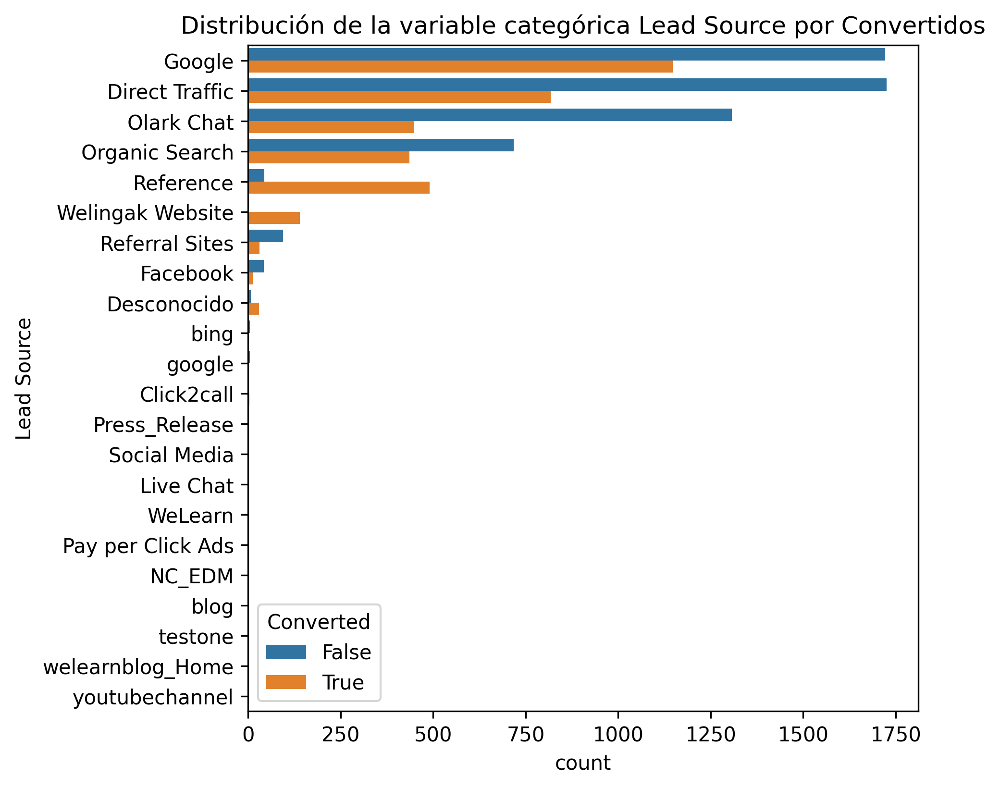

In [ ]:
conteo_de_convertidos('Lead Source')


Observations

The conversion rate appears to be higher for leads that come from the Wellingak website or are referred.

Increasing the number of leads referred to and coming from the Wellingak website is likely to increase the overall conversion rate.

Although Google and Direct Traffic are the source of a similar number of leads, the conversion rate appears to be higher among leads that come from Google.

There are fewer leads from Organic Search as a source than from Google, but leads that come from both sources appear to have a similar conversion rate.

In [ ]:
# Exploratory Analysis of a Variable: Last Activity

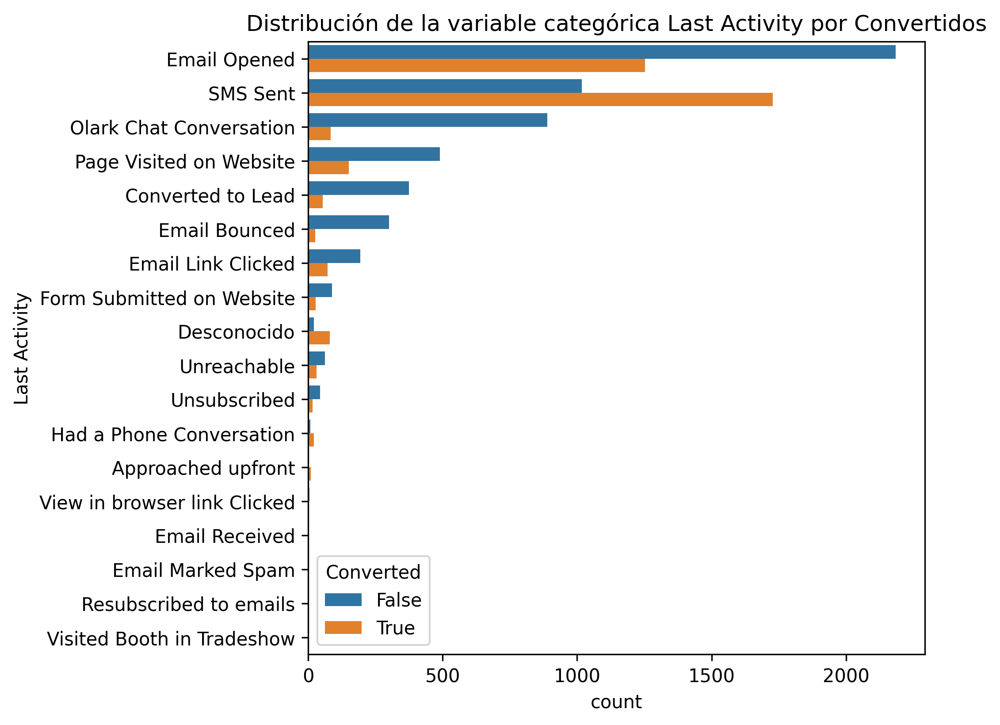

In [ ]:
conteo_de_convertidos('Last Activity')

The Last Activity with the highest conversion rate by far is Sending SMS.

Further investigation is required to determine whether this is a result of the effectiveness of this activity or simply the stage at which it occurs in the lead nurturing process.

In [ ]:
# Exploratory Analysis of a Variable: Lead Origin

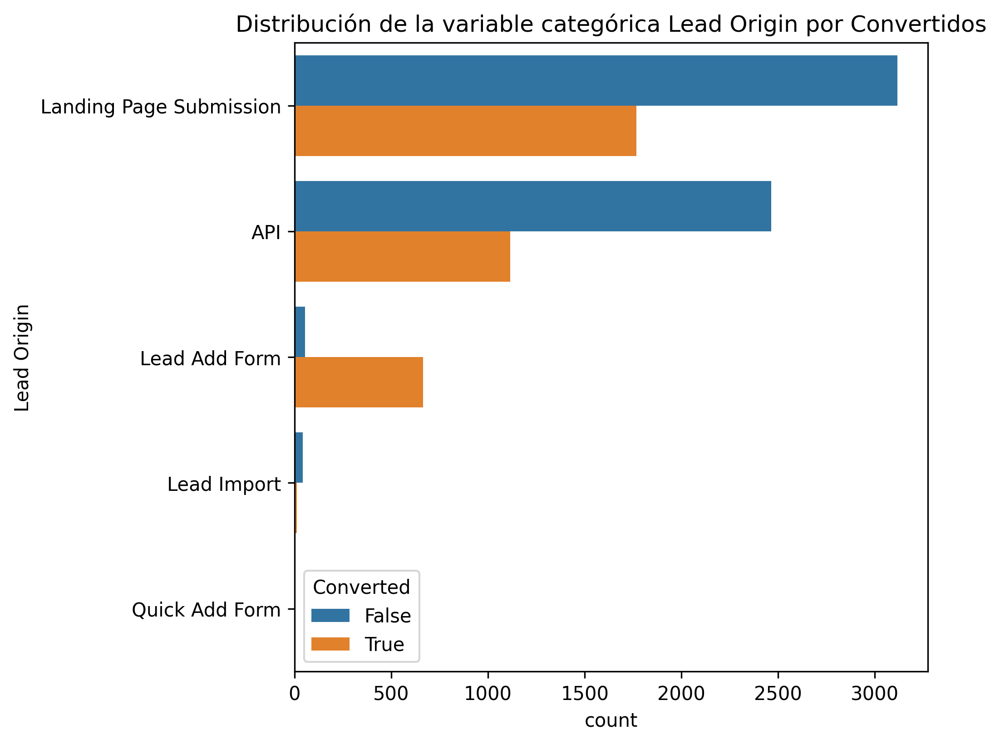

In [ ]:
conteo_de_convertidos('Lead Origin')

Significantly more leads convert when they originate through the 'Add Lead' form. 

The lead conversion rate appears to be slightly higher among those originating from 'Landing Page Submission' than from 'API'.

# Exploratory Analysis of Boolean Variables

In [ ]:
# We create the function confusion_matrix to plot the heat map of the confusion matrix of a feature 
# boolean versus Converted and add relevant tags. It will be very useful for boolean variables.

In [ ]:
def matriz_de_confusion(independiente, dependiente = 'Converted'):
    mdc=confusion_matrix(df[independiente], df[dependiente])
    plt.figure(figsize=(4,4), dpi = 300)
    sns.heatmap(mdc, annot=True, fmt='', xticklabels=['No','Yes'], yticklabels=['No','Yes'], cmap='Blues')
    plt.title("Matriz de Confusión " + independiente + " vs. " + dependiente)
    plt.xlabel(dependiente)
    plt.ylabel(independiente)
    plt.show()

In [ ]:
# Confusion Matrix of 'Get updates on DM Content' vs. 'Converted'

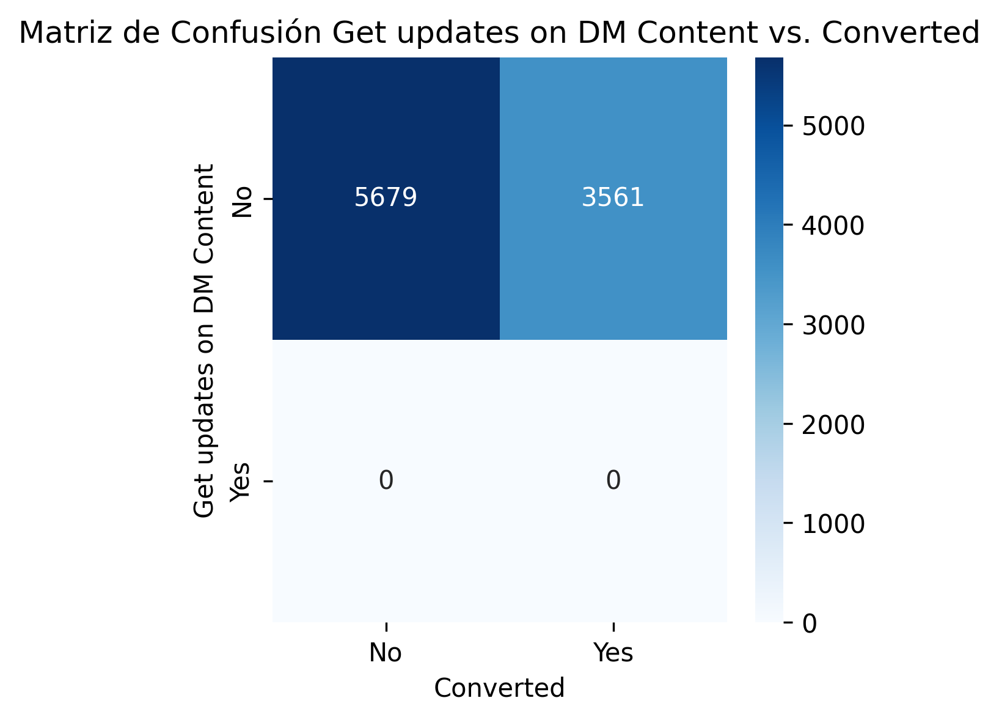

In [ ]:
matriz_de_confusion('Get updates on DM Content')

No prospects indicated they wanted to receive updates on DM (Direct Marketing) content.
Sending this type of content to prospects is obviously not in their interest, both for those who did not sign up and for those who finally did sign up.

In [ ]:
# Do not email vs "Converted"

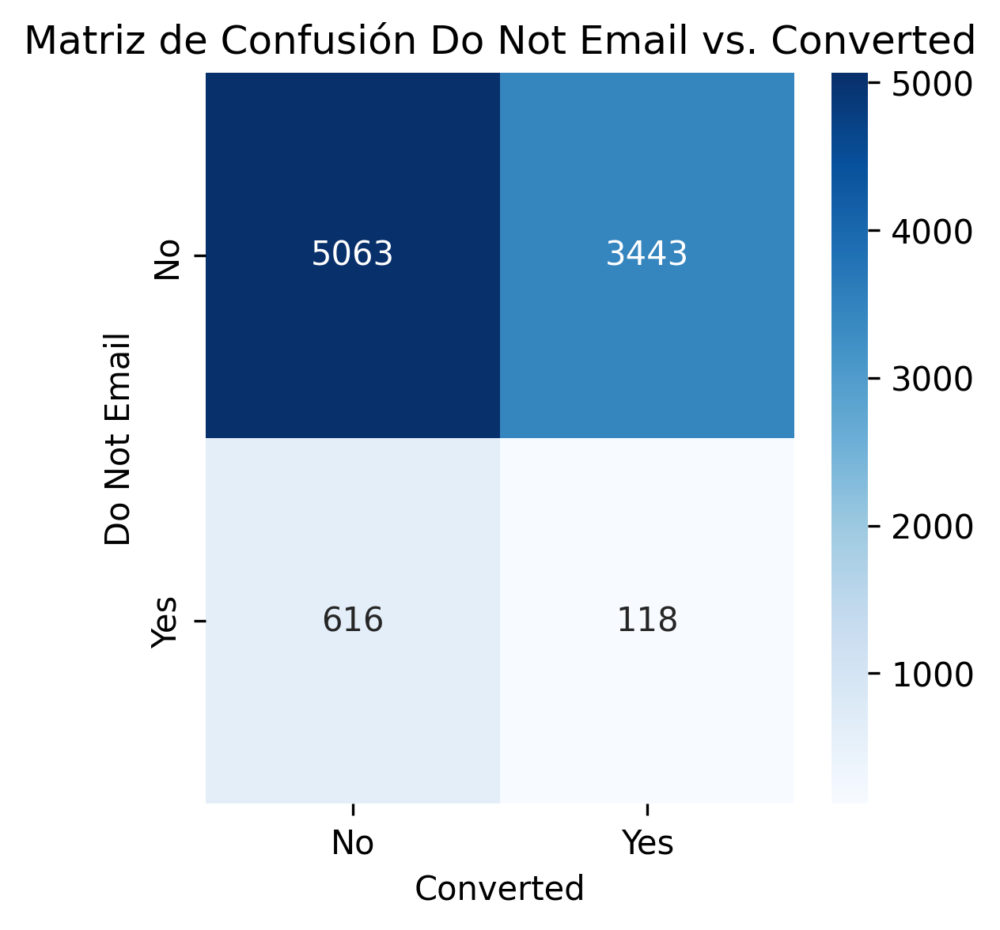

In [ ]:
matriz_de_confusion('Do Not Email')

The majority of prospects indicate “No” to the Do Not Email option, suggesting that the sales team is free to contact them via email.

The conversion rate among prospects who indicate “No” to the Do Not Call option is 40.47% = 3443/(5063+3443)

Very few prospects have a “Yes” to the Do Not Email option (7.94% = (616+118)/9240). The conversion rate between these is only 16.08% = 118/(616+118). Since they indicate not to be contacted we can see their lack of interest in signing up.

In [ ]:
# Confusion Matrix of 'A free copy of Mastering The Interview' vs. 'Converted'

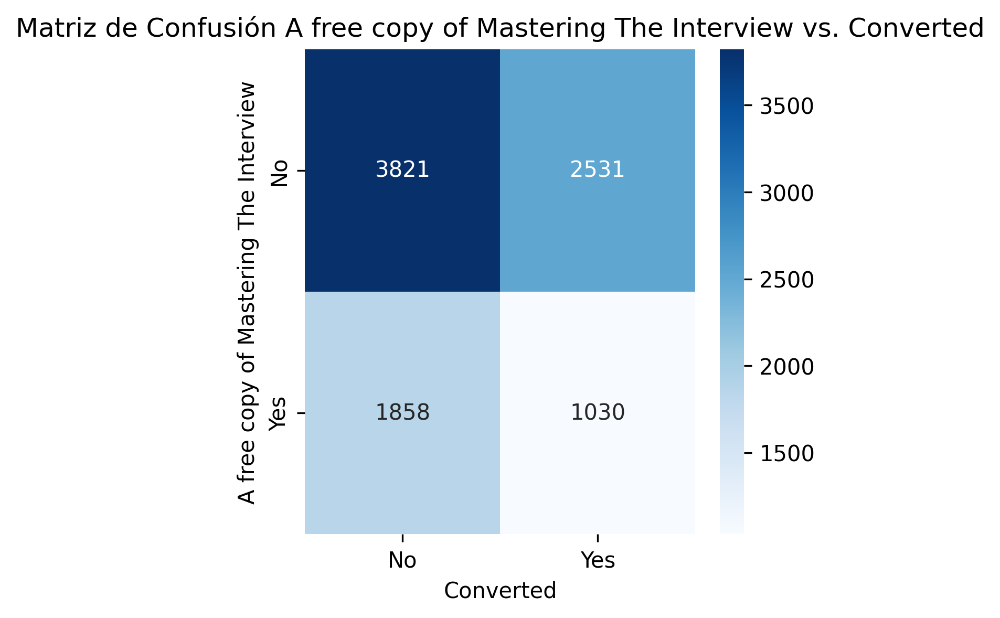

In [ ]:
matriz_de_confusion('A free copy of Mastering The Interview')

Almost 1/3 of prospects wanted to receive a free copy of the book 31.3% = (1858+1030)/9240.

Interestingly, prospects who received a free copy of the book had a lower conversion rate (35.7% = 1030/(1858+1030) than those who did not (39.8% = 2531/(3821+2531)

Could this be because once prospects receive a copy of Mastering the Interview, they don't feel the need for the courses? Did they just give their details to get the free content?

# Exploratory Analysis of Numerical Variables

In [ ]:
# Let's define the box and whisker plot function

In [ ]:
def grafico_de_caja(independiente, dependiente='Converted'):
    plt.figure(figsize=(4,4), dpi =300)
    sns.boxplot(y=independiente, data=df, x = dependiente, hue = dependiente)
    plt.title("Gráficos de Caja de " + independiente + " por valores V/F de " + dependiente)
    plt.show()

In [ ]:
# Box Plot of 'Total Time Spent on Website'

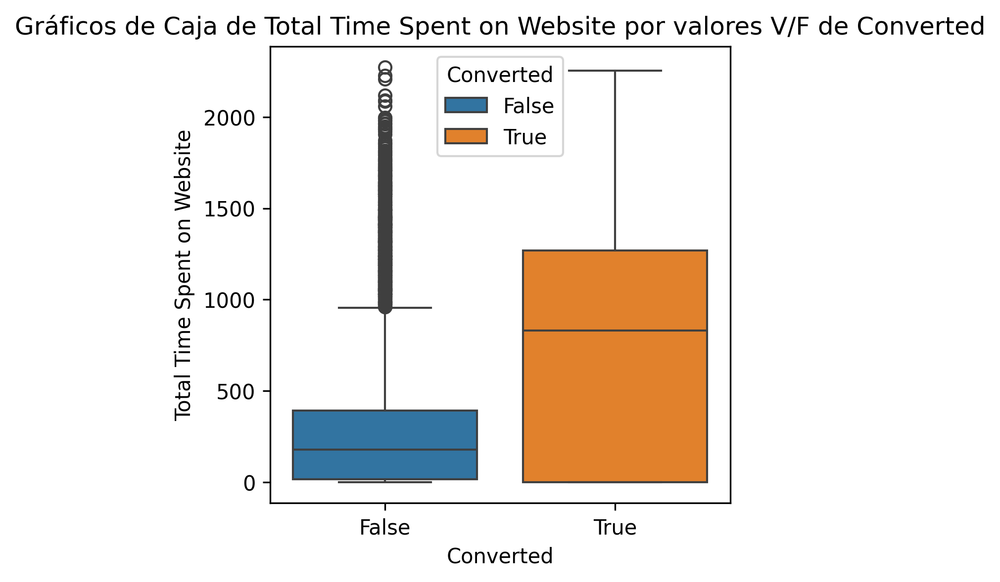

In [ ]:
grafico_de_caja('Total Time Spent on Website')

Insights:

The Interquartile Range (IQR) of Total Time Spent on Website for prospects who convert is much higher than for those who don't convert.

Encouraging prospects to spend more time on the website is likely to increase the overall conversion rate.

I could even focus on those leads who spent significant time on the website, but did not purchase. They may be interested and you should put more effort into closing the sale.

In [ ]:
# Box Plot of 'Page Views Per Visit'

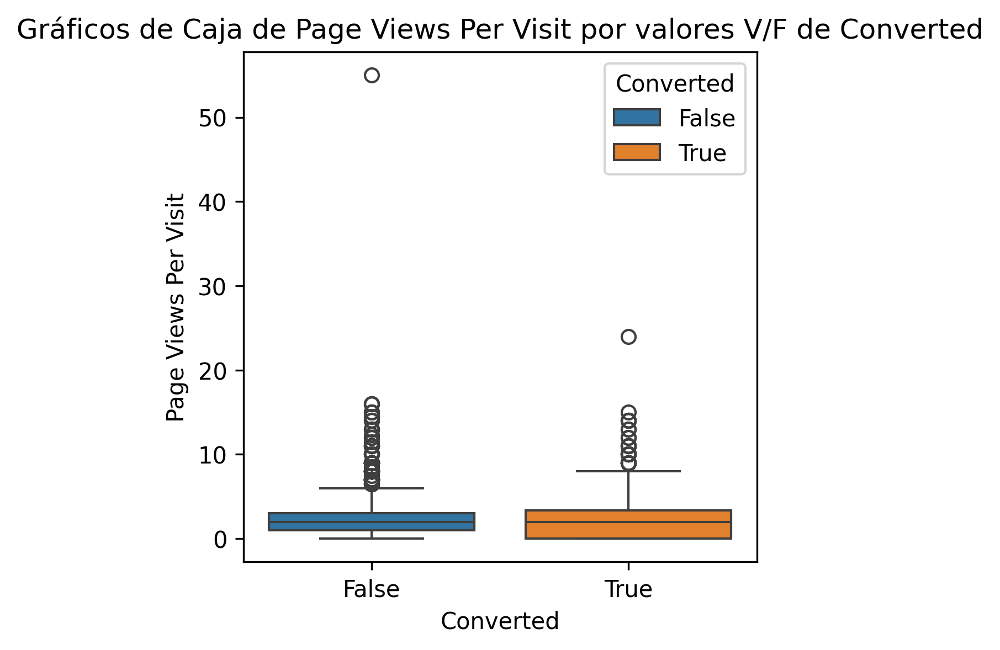

In [ ]:
grafico_de_caja('Page Views Per Visit')

All leads appear to see a similar number of pages per visit on average, regardless of conversion status.

However, the Interquartile Range (IQR) of Page Views Per Visit is higher for leads that convert, in part because a large portion of leads that convert average 0 page views per visit.

The outlier who viewed 55 pages per visit on average might not be a sales opportunity, but in fact a competitor or a staff member viewing the website.

In [ ]:
# Boxplot of 'TotalVisits'

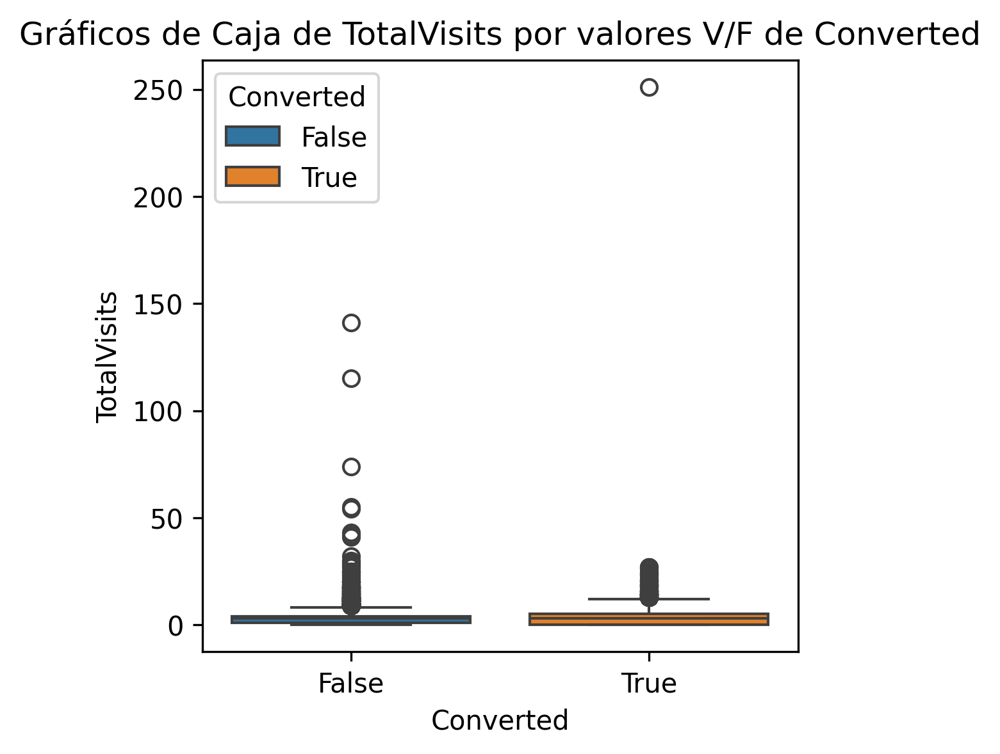

In [ ]:
grafico_de_caja('TotalVisits')

In [ ]:
# It is not possible to interpret it due to the dispersion of the outliers. 
# Let's remove leads with more than 30 visits to the website

<Axes: xlabel='Converted', ylabel='TotalVisits'>

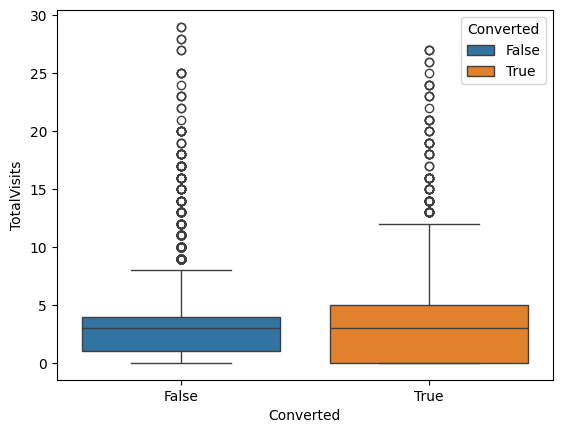

In [ ]:
sns.boxplot(y='TotalVisits', data = df[df['TotalVisits']<30], x = 'Converted', hue = 'Converted')

In addition to visiting the website more frequently, sales leads that convert appear to show greater dispersion and Interquartile Range (IQR) than leads that do not convert.

# Development of the Logistic Regression Model

We identify the predictors of the model (all df variables with the exception of 'Converted' which is the dependent variable). We will also generate dummy variables from the categorical variables.

In [ ]:
# We discard the dependent variable and generate the categorical dummies

In [ ]:
X = pd.get_dummies(df.drop(columns='Converted', axis=1))

In [ ]:
X.head()

,Do Not Email,Do Not Call,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Search,Magazine,Newspaper Article,X Education Forums,Newspaper,...,Last Notable Activity_Form Submitted on Website,Last Notable Activity_Had a Phone Conversation,Last Notable Activity_Modified,Last Notable Activity_Olark Chat Conversation,Last Notable Activity_Page Visited on Website,Last Notable Activity_Resubscribed to emails,Last Notable Activity_SMS Sent,Last Notable Activity_Unreachable,Last Notable Activity_Unsubscribed,Last Notable Activity_View in browser link Clicked
Lead Number,,,,,,,,,,,,,,,,,,,,,
660737,False,False,0.0,0,0.0,False,False,False,False,False,...,False,False,True,False,False,False,False,False,False,False
660728,False,False,5.0,674,2.5,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
660727,False,False,2.0,1532,2.0,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
660719,False,False,1.0,305,1.0,False,False,False,False,False,...,False,False,True,False,False,False,False,False,False,False
660681,False,False,2.0,1428,1.0,False,False,False,False,False,...,False,False,True,False,False,False,False,False,False,False


In [ ]:
Y = df['Converted']

Then, we split our data into a training set and a test set (80% of the data will be used for the training set, while the remaining 20% ​​will be used in the test set).

In [ ]:
X_entrenamiento, X_evaluacion, Y_entrenamiento, Y_evaluacion = train_test_split(X, Y, test_size = 0.2,
                                                                               random_state = 99, stratify = Y)

The parameter stratify = Y in train_test_split ensures that the proportion of classes in the training and testing sets is the same as the proportion of classes in the original data set Y. This is crucial to maintain a representative and balanced distribution of classes, especially in cases of significant imbalance between them.

Variable Scaling


Scaling variables is an essential step to improve the effectiveness of classification models, as these numerical predictors often vary in magnitude and scale. In our data set, the numerical variables to consider are:


Total Visits

Total Time on Website

Page Views per Visit

When these variables are not normally distributed, which is our case, the use of the MinMaxScaler technique is recommended for standardization. This method fits the data within a specific range, usually 0 to 1, and is particularly useful when we do not assume a normal distribution in our variables.

On the other hand, when the data does have a normal distribution, normalization—or Z standardization—is usually the most appropriate option. This process transforms the data so that it has a mean of zero and a standard deviation of one, which corresponds to the standard normal distribution. Normalization is very useful because many machine learning algorithms—such as those that use distance measures—operate under the assumption that data is normally distributed.

In summary, while MinMax standardization is optimal for data with disparate ranges and no normal distribution, Z normalization is ideal for data that already fit a normal distribution, making it easier to compare and interpret coefficients in linear models.

In [ ]:
# Scaling variables using MixMaxScaler

In [ ]:
# We generate the list of scalar variables

In [ ]:
var_escalar = ['TotalVisits', 'Total Time Spent on Website','Page Views Per Visit']

In [ ]:
# We create the MinMaxScaler instance

In [ ]:
escalar = MinMaxScaler()

In [ ]:
# We transform the variables with MixMaxScaler
# First the training base

In [ ]:
X_entrenamiento[var_escalar] = escalar.fit_transform(X_entrenamiento[var_escalar])

In [ ]:
X_entrenamiento.head()

,Do Not Email,Do Not Call,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Search,Magazine,Newspaper Article,X Education Forums,Newspaper,...,Last Notable Activity_Form Submitted on Website,Last Notable Activity_Had a Phone Conversation,Last Notable Activity_Modified,Last Notable Activity_Olark Chat Conversation,Last Notable Activity_Page Visited on Website,Last Notable Activity_Resubscribed to emails,Last Notable Activity_SMS Sent,Last Notable Activity_Unreachable,Last Notable Activity_Unsubscribed,Last Notable Activity_View in browser link Clicked
Lead Number,,,,,,,,,,,,,,,,,,,,,
627877,False,False,0.015936,0.672975,0.072727,False,False,False,False,False,...,False,False,False,False,False,False,True,False,False,False
585642,False,False,0.015936,0.079225,0.036364,False,False,False,False,False,...,False,False,True,False,False,False,False,False,False,False
617566,False,False,0.023904,0.453345,0.054545,False,False,False,False,False,...,False,False,True,False,False,False,False,False,False,False
655639,False,False,0.015936,0.001320,0.072727,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
593227,False,False,0.003984,0.210387,0.018182,False,False,False,False,False,...,False,False,True,False,False,False,False,False,False,False


And now the evaluation basis:
In data scaling, we use fit_transform on the training set to calculate the scaling parameters (such as minimum and maximum) and then apply the transformation. Instead, for the evaluation set, we only use transform to apply the same parameters already calculated, thus ensuring consistency and avoiding bias in our model.

In [ ]:
X_evaluacion[var_escalar] = escalar.transform(X_evaluacion[var_escalar])

In [ ]:
X_evaluacion.head()

,Do Not Email,Do Not Call,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Search,Magazine,Newspaper Article,X Education Forums,Newspaper,...,Last Notable Activity_Form Submitted on Website,Last Notable Activity_Had a Phone Conversation,Last Notable Activity_Modified,Last Notable Activity_Olark Chat Conversation,Last Notable Activity_Page Visited on Website,Last Notable Activity_Resubscribed to emails,Last Notable Activity_SMS Sent,Last Notable Activity_Unreachable,Last Notable Activity_Unsubscribed,Last Notable Activity_View in browser link Clicked
Lead Number,,,,,,,,,,,,,,,,,,,,,
591899,False,False,0.015936,0.173856,0.024182,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
604007,False,False,0.019920,0.412852,0.090909,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
653773,False,False,0.011952,0.111356,0.054545,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
611519,False,False,0.015936,0.699384,0.072727,False,False,False,False,False,...,False,False,True,False,False,False,False,False,False,False
584568,False,False,0.007968,0.014525,0.036364,False,False,False,False,False,...,False,False,False,False,False,False,True,False,False,False


Scaling data with MinMaxScaler after splitting the set into training and testing, rather than before, is a best practice to avoid data leakage. When you scale data before splitting, the scaling process takes into account the entire distribution of the data, including those in the evaluation set, which can lead to an unrealistically optimistic assessment of model performance. By scaling after splitting, you ensure that the scaling process is only based on the training data, thus maintaining the validity of the evaluation on the test set, which simulates unseen data.








In [ ]:
# Create the logistic regression model

In [ ]:
modelo_rl = LogisticRegression()

In [ ]:
# Train the model with the training data

In [ ]:
modelo_rl.fit(X_entrenamiento, Y_entrenamiento)

LogisticRegression()

In [ ]:
# Predict the probabilities on the evaluation set

In [ ]:
Y_prediccion = modelo_rl.predict_proba(X_evaluacion)[:, 1]

In [ ]:
Y_prediccion

array([0.40144738, 0.9065351 , 0.06686649, ..., 0.14830148, 0.98096891,
       0.05108272])

# AUC y ROC

In [ ]:
# Calculate the area under the curve (AUC)
# Let's estimate fpr and tpr from the roc_curve function

The roc_curve function generates several breakpoints and calculates the True Positive Rate (TPR) and False Positive Rate (FPR) for each of them. The ROC curve is a graphical representation of these pairs of TPR and FPR at different thresholds, providing a comprehensive view of the model's ability to discriminate between classes across a variety of cutpoints.

The roc_curve function from the sklearn.metrics library calculates the values ​​of the False Positive Rate (fpr), the True Positive Rate (tpr), and the corresponding decision thresholds, from the true labels and prediction probabilities. These values ​​are generated as three separate arrays that we store directly in the variables fpr, tpr and cut_points.

In [ ]:
fpr, tpr, puntos_de_corte= roc_curve(Y_evaluacion, Y_prediccion)

In [ ]:
fpr

array([0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 8.80281690e-04,
       8.80281690e-04, 1.76056338e-03, 1.76056338e-03, 1.76056338e-03,
       1.76056338e-03, 1.76056338e-03, 1.76056338e-03, 2.64084507e-03,
       2.64084507e-03, 2.64084507e-03, 2.64084507e-03, 2.64084507e-03,
       2.64084507e-03, 3.52112676e-03, 3.52112676e-03, 3.52112676e-03,
       3.52112676e-03, 4.40140845e-03, 4.40140845e-03, 4.40140845e-03,
       4.40140845e-03, 4.40140845e-03, 5.28169014e-03, 5.28169014e-03,
       5.28169014e-03, 5.28169014e-03, 6.16197183e-03, 6.16197183e-03,
       7.04225352e-03, 7.04225352e-03, 7.92253521e-03, 7.92253521e-03,
       7.92253521e-03, 7.92253521e-03, 7.92253521e-03, 8.80281690e-03,
       8.80281690e-03, 1.23239437e-02, 1.23239437e-02, 1.32042254e-02,
       1.32042254e-02, 1.40845070e-02, 1.40845070e-02, 1.49647887e-02,
      

In [ ]:
tpr

array([0.        , 0.00140449, 0.00702247, 0.01264045, 0.01404494,
       0.01685393, 0.02106742, 0.0238764 , 0.06741573, 0.07162921,
       0.08567416, 0.08567416, 0.09550562, 0.09550562, 0.1011236 ,
       0.10393258, 0.11797753, 0.13061798, 0.14325843, 0.14325843,
       0.19803371, 0.20365169, 0.20786517, 0.21067416, 0.23876404,
       0.23876404, 0.27668539, 0.27949438, 0.28230337, 0.28230337,
       0.30758427, 0.31320225, 0.31741573, 0.3258427 , 0.3258427 ,
       0.32724719, 0.33286517, 0.33567416, 0.33567416, 0.35393258,
       0.35393258, 0.35674157, 0.35674157, 0.36095506, 0.36516854,
       0.36797753, 0.37640449, 0.37640449, 0.38061798, 0.38483146,
       0.39044944, 0.39044944, 0.39606742, 0.39606742, 0.39747191,
       0.39747191, 0.40449438, 0.40449438, 0.40870787, 0.40870787,
       0.41713483, 0.41713483, 0.43820225, 0.43820225, 0.43960674,
       0.43960674, 0.45786517, 0.45786517, 0.46348315, 0.46348315,
       0.46769663, 0.46769663, 0.47752809, 0.47752809, 0.48735

In [ ]:
puntos_de_corte

array([       inf, 0.99899899, 0.99843742, 0.99832393, 0.99822492,
       0.99816598, 0.99796567, 0.99795474, 0.99130416, 0.99090951,
       0.98884926, 0.98884685, 0.98737044, 0.98693691, 0.9865649 ,
       0.98649439, 0.98384487, 0.98358476, 0.98211736, 0.98201092,
       0.9716436 , 0.97133661, 0.96858636, 0.96711266, 0.95827654,
       0.95774145, 0.9453966 , 0.94437306, 0.94339645, 0.943383  ,
       0.93614148, 0.93604357, 0.93472554, 0.93024289, 0.9296344 ,
       0.92925403, 0.92863064, 0.92841785, 0.92815078, 0.91920384,
       0.91908891, 0.9178893 , 0.9178788 , 0.91771002, 0.91525704,
       0.91355469, 0.91119457, 0.9107943 , 0.9086632 , 0.90838012,
       0.90476991, 0.90467791, 0.90229192, 0.90054738, 0.90015542,
       0.89926248, 0.8963002 , 0.89619774, 0.89376639, 0.89358163,
       0.88839495, 0.88740651, 0.87880661, 0.87655062, 0.87632102,
       0.87527376, 0.86118881, 0.86108887, 0.85964592, 0.8572025 ,
       0.85359981, 0.85131076, 0.84176777, 0.84089366, 0.83615

In [ ]:
# Calculate the area under the curve (AUC)

In [ ]:
auc_rl = auc(fpr, tpr)

In [ ]:
auc_rl

0.9198010217202087

In [ ]:
# Plot the ROC curve

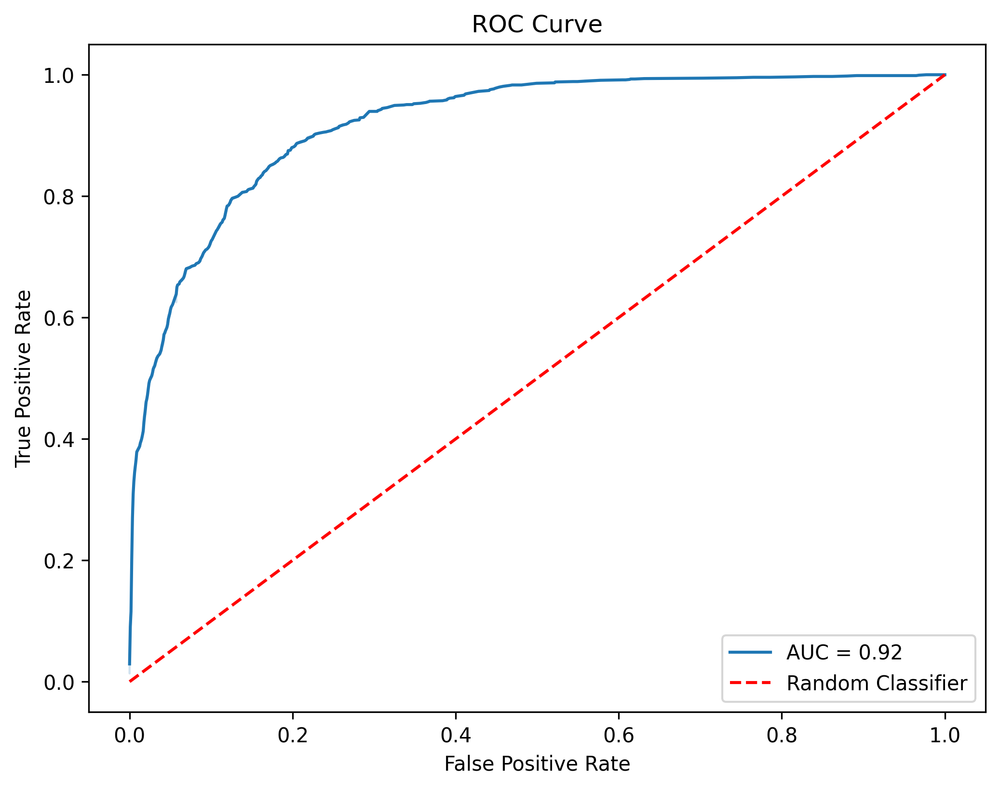

In [ ]:
plt.figure(figsize=(8, 6), dpi=300)
sns.lineplot(x=fpr, y=tpr, label='AUC = %0.2f' % auc_rl)
plt.plot([0, 1], [0, 1], color='red', linestyle='--', label='Random Classifier')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()
plt.show()

Based on the ROC curve obtained with an AUC of 0.92, we can conclude that the classification model has shown very good performance. An AUC of 0.92 means that there is a high probability that the model correctly classifies a positive random observation over a negative one. This indicates that the model has an excellent ability to distinguish between the two classes. However, it is important to note that the AUC value is even more informative when compared to the AUC of other models. In a practical modeling environment, we compare several models not only in terms of their AUC but also considering other metrics and the context of their application. For example, a model with a slightly lower AUC might be preferred if it is more interpretable or better fits business expectations. In summary, this AUC of 0.92 is an encouraging result and provides us with a solid basis for comparison with other models in our quest to find the best fit for our classification needs.

# Prediction by Decision tree

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from imblearn.over_sampling import SMOTE
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.metrics import roc_curve, auc

In [ ]:
df = pd.read_csv('EON_preprocesado.csv', index_col = 'Lead Number')

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 9240 entries, 660737 to 579533
Data columns (total 31 columns):
 #   Column                                         Non-Null Count  Dtype  
---  ------                                         --------------  -----  
 0   Lead Origin                                    9240 non-null   object 
 1   Lead Source                                    9240 non-null   object 
 2   Do Not Email                                   9240 non-null   bool   
 3   Do Not Call                                    9240 non-null   bool   
 4   Converted                                      9240 non-null   bool   
 5   TotalVisits                                    9240 non-null   float64
 6   Total Time Spent on Website                    9240 non-null   int64  
 7   Page Views Per Visit                           9240 non-null   float64
 8   Last Activity                                  9240 non-null   object 
 9   Country                                        924

In [ ]:
# Coding for categorical variables (we transform them into dummies)

In [ ]:
df = pd.get_dummies(df, drop_first = True)

In [ ]:
df.head()

,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Search,Magazine,Newspaper Article,X Education Forums,...,Last Notable Activity_Form Submitted on Website,Last Notable Activity_Had a Phone Conversation,Last Notable Activity_Modified,Last Notable Activity_Olark Chat Conversation,Last Notable Activity_Page Visited on Website,Last Notable Activity_Resubscribed to emails,Last Notable Activity_SMS Sent,Last Notable Activity_Unreachable,Last Notable Activity_Unsubscribed,Last Notable Activity_View in browser link Clicked
Lead Number,,,,,,,,,,,,,,,,,,,,,
660737,False,False,False,0.0,0,0.0,False,False,False,False,...,False,False,True,False,False,False,False,False,False,False
660728,False,False,False,5.0,674,2.5,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
660727,False,False,True,2.0,1532,2.0,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
660719,False,False,False,1.0,305,1.0,False,False,False,False,...,False,False,True,False,False,False,False,False,False,False
660681,False,False,True,2.0,1428,1.0,False,False,False,False,...,False,False,True,False,False,False,False,False,False,False


In [ ]:
# Division between characteristics (independent) and target variable (dependent)

In [ ]:
X = df.drop('Converted', axis = 1)

In [ ]:
Y = df['Converted']

In [ ]:
# Balance classes

In [ ]:
# Count the number of records in each class

In [ ]:
conteo_clases = df['Converted'].value_counts()

In [ ]:
conteo_clases

Converted
False    5679
True     3561
Name: count, dtype: int64

In [ ]:
porcentajes_clases = (conteo_clases / len(df['Converted'])) * 100

In [ ]:
porcentajes_clases

Converted
False    61.461039
True     38.538961
Name: count, dtype: float64

Although the imbalance is not extreme, there is a significant difference between the classes: approximately 61% of the records belong to the False class and 39% to the True class.

In the context of predictive models such as decision trees, this level of imbalance can lead to a bias in predictions towards the majority class. Balancing classes can help improve the accuracy and generalization of the model, ensuring that the importance of the most common class is not overestimated.

To balance the classes, you can use techniques such as oversampling the minority class or undersampling the majority class. A common tool for oversampling is SMOTE (Synthetic Minority Over-sampling Technique), which generates synthetic records for the minority class based on existing ones, rather than simply replicating existing records.

In [ ]:
# Apply SMOTE to balance classes

In [ ]:
# We create an object of the SMOTE() class

In [ ]:
smote = SMOTE()

In [ ]:
# We balance the characteristics (independent) and the objective (dependent)

In [ ]:
X_equilibrado, Y_equilibrado = smote.fit_resample(X,Y)

In [ ]:
# We check that they are balanced

In [ ]:
conteo_clases = Y_equilibrado.value_counts()

In [ ]:
conteo_clases

Converted
False    5679
True     5679
Name: count, dtype: int64

In [ ]:
# Split the data into training and test sets

In [ ]:
X_entrenamiento, X_evaluacion, Y_entrenamiento, Y_evaluacion = train_test_split(X_equilibrado, Y_equilibrado,
                                                                               test_size = 0.2, random_state = 99)

In [ ]:
# Initialize MinMaxScaler

In [ ]:
scaler = MinMaxScaler()

In [ ]:
# Fit the scaler to the training data and transform it

In [ ]:
X_entrenamiento = scaler.fit_transform(X_entrenamiento)

In [ ]:
# Transform evaluation data

In [ ]:
X_evaluacion = scaler.transform(X_evaluacion)

# Creating and Viewing the Classification Tree

In [ ]:
# Create the decision tree model object with a fixed random state for reproducibility

In [ ]:
arbol_clasificacion = DecisionTreeClassifier(random_state=99)

In [ ]:
# Entrenar el modelo con los conjuntos de entrenamiento

In [ ]:
arbol_clasificacion.fit(X_entrenamiento, Y_entrenamiento)

DecisionTreeClassifier(random_state=99)

In [ ]:
# Generate tree visualization
# X_training is an array, but we could get the names of the variables from X which is a df

In [ ]:
plt.figure(figsize=(20,100), dpi = 300)
plot_tree(arbol_clasificacion,
         feature_names = X.columns.tolist(),
         class_names = ['No compró', 'Compró'],
         filled = True, impurity = False, rounded = True, fontsize = 10)
plt.show()

In [ ]:
# Simplify the tree by setting a reasonable 'max_depth'.

In [ ]:
arbol_simplificado = DecisionTreeClassifier(max_depth=3, random_state = 99)

In [ ]:
arbol_simplificado.fit(X_entrenamiento, Y_entrenamiento)

DecisionTreeClassifier(max_depth=3, random_state=99)

In [ ]:
# Plot the simplified tree

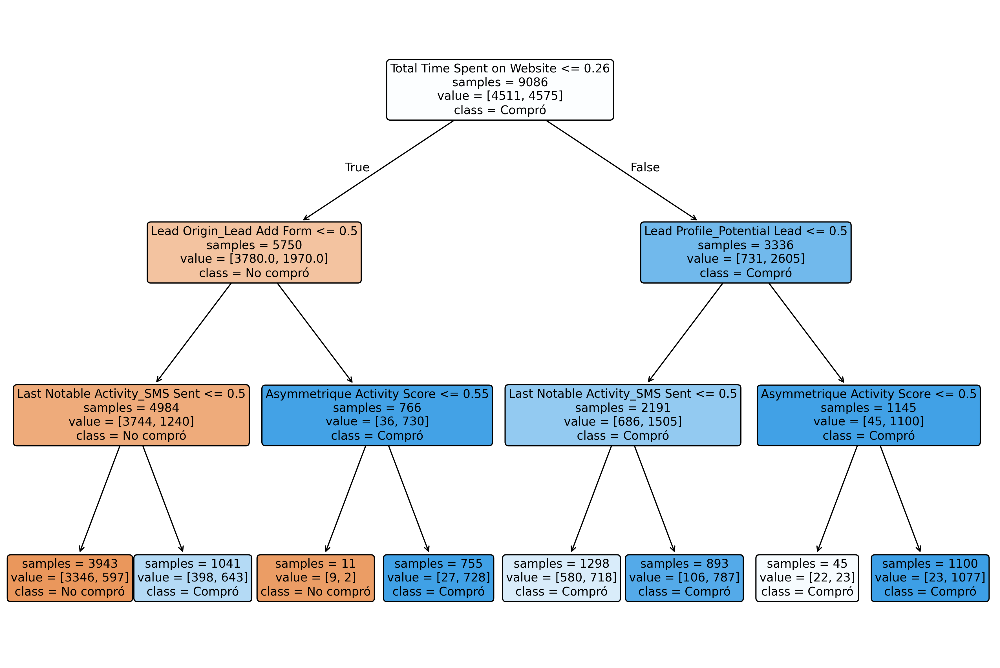

In [ ]:
plt.figure(figsize=(15,10), dpi = 300)
plot_tree(arbol_simplificado,
         feature_names = X.columns.tolist(),
         class_names = ['No compró', 'Compró'],
         filled = True, impurity = False, rounded = True, fontsize = 10)
plt.show()

In [ ]:
# Let's create several trees, generate a function that takes the name of the tree as a parameter and graphs it

In [ ]:
def graficar_arbol_de_decision(arbol):
    plt.figure(figsize=(20,20), dpi = 300)
    plot_tree(arbol,
              feature_names = X.columns.tolist(),
              class_names = ['No compró', 'Compró'],
              filled = True, impurity = False, rounded = True, fontsize = 10)
    plt.show()    

# Use of min_samples_leaf
Another effective strategy is to define the minimum number of samples a node must have to be considered a leaf through min_samples_leaf. This constraint ensures that each decision made by the tree is supported by a sufficient number of data, increasing confidence in the predictions.

In [ ]:
# Create the DecisionTreeClassifier instance

In [ ]:
arbol_poda_min_samples_leaf_100 = DecisionTreeClassifier(min_samples_leaf = 100, random_state = 99)

In [ ]:
# We fit the model with the training data

In [ ]:
arbol_poda_min_samples_leaf_100.fit(X_entrenamiento, Y_entrenamiento)

DecisionTreeClassifier(min_samples_leaf=100, random_state=99)

In [ ]:
# Plot our new tree

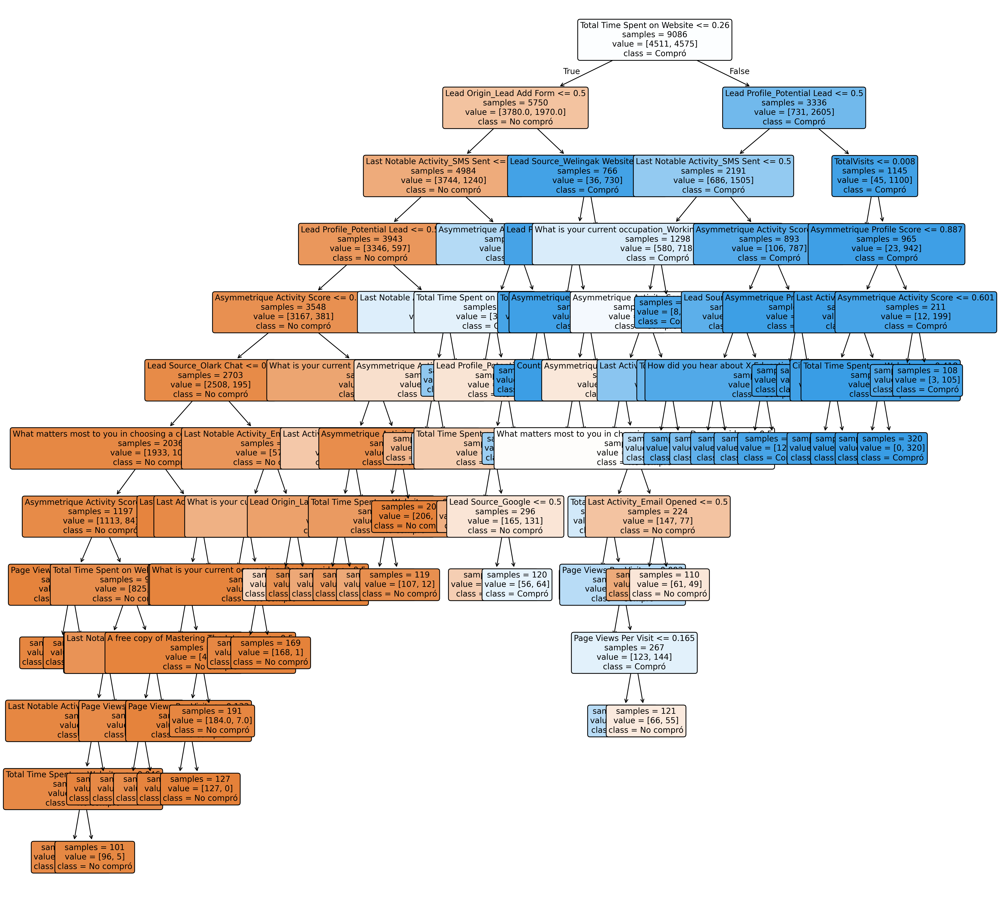

In [ ]:
graficar_arbol_de_decision(arbol_poda_min_samples_leaf_100)

In [ ]:
# We got a fairly complex tree. What if we can add a greater restriction? 
# to number of samples per sheet = 200

In [ ]:
arbol_poda_min_samples_leaf_200 = DecisionTreeClassifier(min_samples_leaf = 200, random_state = 99)

In [ ]:
arbol_poda_min_samples_leaf_200.fit(X_entrenamiento, Y_entrenamiento)

DecisionTreeClassifier(min_samples_leaf=200, random_state=99)

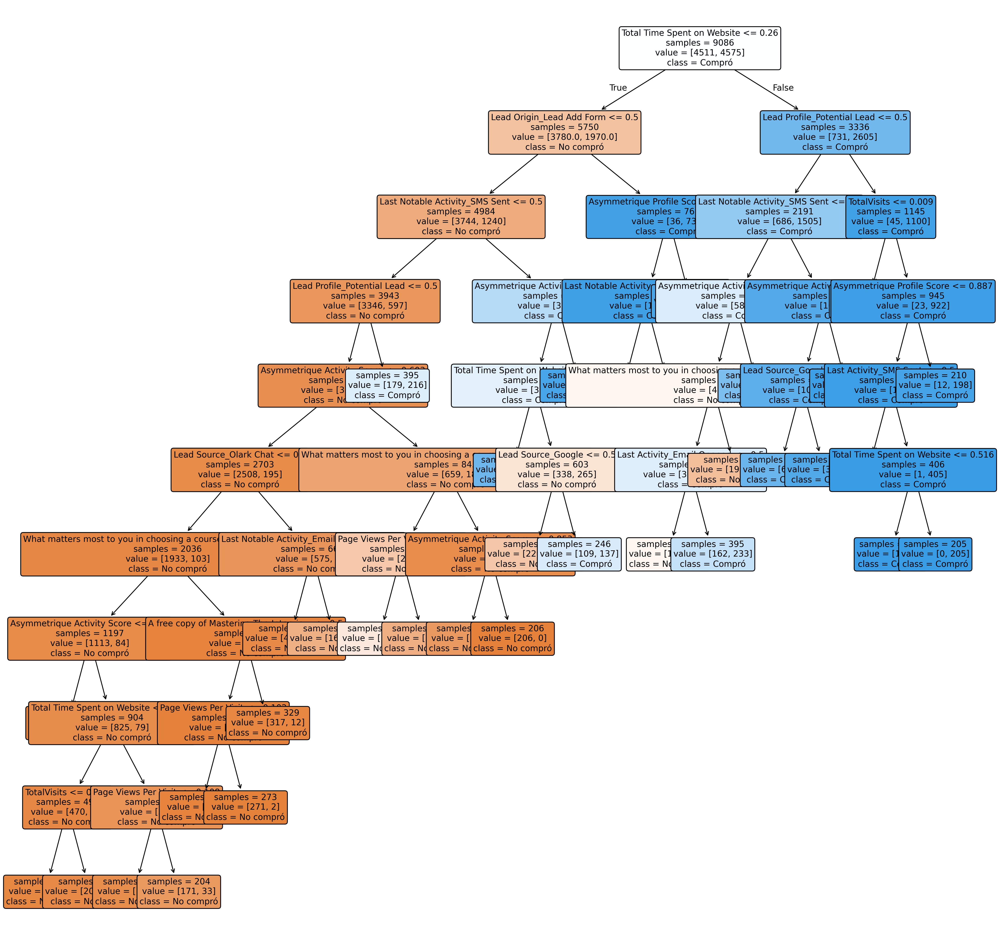

In [ ]:
graficar_arbol_de_decision(arbol_poda_min_samples_leaf_200)

# Hyperparameters and Search Grids

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier

# Define the decision tree base model
modelo_arbol = DecisionTreeClassifier(random_state=99)

# Set parameters for grid search
parametros_grid = {
    'max_depth': [3, 4, 5, 6, 7, 8, 9, 10, 12, 15, 20, 25],
    'min_samples_leaf': [10, 50, 100, 200, 500],
    'ccp_alpha': [0.0, 0.001, 0.002, 0.005, 0.010, 0.1]
}

# Create our object GridSearchCV
grid_search = GridSearchCV(modelo_arbol, parametros_grid, cv=5, scoring='roc_auc', n_jobs=-1)

# Run grid search on training data
grid_search.fit(X_entrenamiento, Y_entrenamiento)

# Best parameters found
mejores_parametros = grid_search.best_params_

# Best model found
mejor_modelo = grid_search.best_estimator_

# Code to print the results
print("Mejores parámetros encontrados:", mejores_parametros)
print("Mejor modelo:", mejor_modelo)


Mejores parámetros encontrados: {'ccp_alpha': 0.0, 'max_depth': 9, 'min_samples_leaf': 10}
Mejor modelo: DecisionTreeClassifier(max_depth=9, min_samples_leaf=10, random_state=99)


In [ ]:
from sklearn.metrics import roc_auc_score

# Assign the best parameters to the model
modelo_optimizado = DecisionTreeClassifier(max_depth=10, min_samples_leaf=10, ccp_alpha=0.0, random_state=99)

# Train the model with the training data
modelo_optimizado.fit(X_entrenamiento, Y_entrenamiento)

# Make predictions on the evaluation set
Y_prediccion = modelo_optimizado.predict_proba(X_evaluacion)[:, 1]

# Calculate AUC using evaluation data
auc_optimizado = roc_auc_score(Y_evaluacion, Y_prediccion)

print("AUC del modelo optimizado:", auc_optimizado)


AUC del modelo optimizado: 0.9256688008735356


# Model Optimization with Grid Search with Hyperparameters

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import roc_auc_score

# Decision Tree Model Configuration
decision_tree = DecisionTreeClassifier(random_state=99)

# Defining hyperparameters for grid search
parametros = {
    'max_depth': [3, 4, 5, 6, 7, 8, 9, 10, 12, 15, 20, 25],
    'min_samples_leaf': [10, 50, 100, 200, 500],
    'ccp_alpha': [0.0, 0.001, 0.002, 0.005, 0.010, 0.1]
}

# Grid search with cross validation
busqueda_cuadricula = GridSearchCV(decision_tree, parametros, cv=5, scoring='roc_auc')
busqueda_cuadricula.fit(X_entrenamiento, Y_entrenamiento)

# Best parameters and model
mejores_parametros = busqueda_cuadricula.best_params_
mejor_modelo = busqueda_cuadricula.best_estimator_

# Train and evaluate the best model
mejor_modelo.fit(X_entrenamiento, Y_entrenamiento)
predicciones = mejor_modelo.predict_proba(X_evaluacion)[:, 1]
auc = roc_auc_score(Y_evaluacion, predicciones)

mejores_parametros, auc

({'ccp_alpha': 0.0, 'max_depth': 9, 'min_samples_leaf': 10},
 0.9256086987542187)

In this project, it was carried out from cleaning, data processing, analysis such as the use of logistic regression and decision tree with the use of grid search cv to know which of the hyperparameters with which we played was the best option to obtain the best results

-Daniel Pulido